In [1]:
import ast
import shutil
from pathlib import Path

import cv2
import dlib
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import face_recognition
from tqdm.auto import tqdm
from PIL import Image
from PIL import ImageColor
import sklearn.cluster as cluster
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

import plotly
import plotly.express as px
import plotly.figure_factory as ff

plotly.offline.init_notebook_mode(connected=True)

# Functions

In [2]:
import plotly.io as pio
pio.renderers.default = 'colab'

In [3]:
def get_palette(df):
    palette = px.colors.qualitative.Alphabet
    palette.extend(px.colors.qualitative.Dark24)
    palette.extend(px.colors.qualitative.Light24)
    palette.extend(px.colors.qualitative.Plotly)
    palette = {label: palette.pop(0) for label in list(set(df['label']))}
    return palette

In [4]:
def save_images(df,
                dst):
    
    if dst.exists():
        shutil.rmtree(dst)
    
    Path.mkdir(dst, parents=True)
        
    for idx, row in df.iterrows():
        fp = dst.joinpath(f'{row["label"]}/{Path(row["fp"]).name}')
        if not fp.parent.exists():
            Path.mkdir(fp.parent)
        shutil.copy(row["fp"], fp)

In [5]:
def get_clusters(data, algorithm, *args, **kwds):
    labels = algorithm(*args, **kwds).fit_predict(data)
    palette = sns.color_palette('deep', np.max(labels) + 1)
    colors = [palette[x] if x >= 0 else (0,0,0) for x in labels]
    return labels, colors

In [6]:
def scatter_thumbnails(data, images, scale_factor=16, colors=None, show_images=True):
    assert len(data) == len(images)

    # reduce embedding dimentions to 2
    x = PCA(n_components=2).fit_transform(data) if len(data[0]) > 2 else data

    # create a scatter plot.
    f = plt.figure(figsize=(22, 15))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(x[:,0], x[:,1], s=4)
    _ = ax.axis('off')
    _ = ax.axis('tight')

    if show_images:
        # add thumbnails :)
        from matplotlib.offsetbox import OffsetImage, AnnotationBbox
        for i in tqdm(range(len(images))):
            image = plt.imread(images[i])
            h, w = image.shape[:2]
            n_h = int(h/scale_factor)
            n_w = int(w/scale_factor)
            image = cv2.resize(image, (n_w, n_h))
            outputImage = cv2.copyMakeBorder(
                 image, 
                 10, 
                 10, 
                 10, 
                 10, 
                 cv2.BORDER_CONSTANT, 
                 value=colors[i] if colors is not None else None)
            im = OffsetImage(image)
            bboxprops = dict(edgecolor=colors[i]) if colors is not None else None
            ab = AnnotationBbox(im, x[i], xycoords='data',
                                frameon=(bboxprops is not None),
                                pad=0.1,
                                bboxprops=bboxprops)
            ax.add_artist(ab)
    return ax

# Data Preparation

In [8]:
files = [x for x in Path('./data/images').iterdir()]
files[0]

PosixPath('data/images/S02E04_54096_0.png')

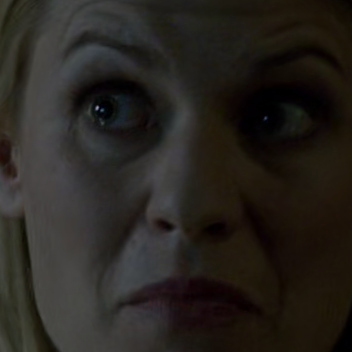

In [9]:
img = Image.open(str(files[0]))
img

In [10]:
frame = cv2.imread(str(files[0]))
frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
h, w = frame.shape[:2]
print(h, w)

352 352


In [11]:
encoding = face_recognition.face_encodings(frame_rgb, known_face_locations=[[0, w, h, 0]])
encoding

[array([-0.08064514,  0.07720837,  0.03460327, -0.06953648, -0.10354943,
        -0.06427178,  0.03810082, -0.12635434,  0.24110679, -0.09772906,
         0.15118331,  0.03994101, -0.42150882,  0.01945604, -0.02423542,
         0.17507309, -0.14027646, -0.19392648, -0.15611465, -0.07657818,
         0.02840304,  0.0720631 ,  0.07907904,  0.05118186, -0.1045636 ,
        -0.30027729, -0.06954741, -0.01773141, -0.01653695, -0.03051785,
         0.01580626,  0.0893147 , -0.14408778, -0.00396242,  0.10040161,
         0.09438179, -0.08604939, -0.17003353,  0.24996118,  0.018077  ,
        -0.22524339, -0.09810632,  0.01545062,  0.23676349,  0.24375193,
        -0.09146856,  0.0628748 , -0.14333755,  0.14860363, -0.36385548,
         0.05570677,  0.17732564,  0.04061523,  0.02068217,  0.14153117,
        -0.19705689,  0.00213294,  0.24524771, -0.21384686,  0.00139753,
         0.12732884, -0.12166221, -0.10520087, -0.13009664,  0.17892383,
         0.0880224 , -0.21030599, -0.13500971,  0.2

In [12]:
df = pd.read_csv('./data/faces.csv', index_col=0)
df.head()

,imdb_id,frame_num,face_num,x1,y1,x2,y2,img_height,img_width,area,pct_of_frame,season,episode,encoding,encoding_deepface,filename,character,cast_id,cluster
0,1811020,192,0,798,196,916,314,1080,1920,13924,0.007,1,1,"[-0.1581144630908966, 0.11875572055578232, 0.0...","[0.02780420333147049, -0.002737875794991851, 0...",S01E01_192_0.png,NaN,NaN,-1.0
1,1811020,216,0,1068,389,1491,812,1080,1920,178929,0.086,1,1,"[-0.035924218595027924, 0.09460100531578064, 0...","[0.016170581802725792, 0.004584379959851503, 0...",S01E01_216_0.png,NaN,NaN,NaN
2,1811020,216,1,912,17,1205,311,1080,1920,86142,0.042,1,1,"[-0.10312943160533905, 0.1261938065290451, 0.0...","[0.018369004130363464, 0.017674073576927185, 0...",S01E01_216_1.png,NaN,NaN,NaN
3,1811020,240,0,1090,106,1384,400,1080,1920,86436,0.042,1,1,"[-0.18763160705566406, 0.08110883831977844, 0....","[0.013896116986870766, 0.0012271195882931352, ...",S01E01_240_0.png,NaN,NaN,NaN
4,1811020,240,1,674,522,968,816,1080,1920,86436,0.042,1,1,"[-0.11751651763916016, 0.1057925745844841, 0.0...","[0.013662656769156456, 0.006698134820908308, 0...",S01E01_240_1.png,NaN,NaN,NaN


In [13]:
episode_df = pd.read_csv('./data/episodes.csv', index_col=0)
df = df.merge(episode_df[['imdb_id', 'cast']],
              on='imdb_id',
              how='left'
             )
df.head()

,imdb_id,frame_num,face_num,x1,y1,x2,y2,img_height,img_width,area,pct_of_frame,season,episode,encoding,encoding_deepface,filename,character,cast_id,cluster,cast
0,1811020,192,0,798,196,916,314,1080,1920,13924,0.007,1,1,"[-0.1581144630908966, 0.11875572055578232, 0.0...","[0.02780420333147049, -0.002737875794991851, 0...",S01E01_192_0.png,NaN,NaN,-1.0,"0000132,0507073,1072555,0362873,1459109,209313..."
1,1811020,216,0,1068,389,1491,812,1080,1920,178929,0.086,1,1,"[-0.035924218595027924, 0.09460100531578064, 0...","[0.016170581802725792, 0.004584379959851503, 0...",S01E01_216_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313..."
2,1811020,216,1,912,17,1205,311,1080,1920,86142,0.042,1,1,"[-0.10312943160533905, 0.1261938065290451, 0.0...","[0.018369004130363464, 0.017674073576927185, 0...",S01E01_216_1.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313..."
3,1811020,240,0,1090,106,1384,400,1080,1920,86436,0.042,1,1,"[-0.18763160705566406, 0.08110883831977844, 0....","[0.013896116986870766, 0.0012271195882931352, ...",S01E01_240_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313..."
4,1811020,240,1,674,522,968,816,1080,1920,86436,0.042,1,1,"[-0.11751651763916016, 0.1057925745844841, 0.0...","[0.013662656769156456, 0.006698134820908308, 0...",S01E01_240_1.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313..."


In [14]:
data = []
for file in tqdm(files):
    temp, frame_num, face_num = file.stem.split('_')
    s = int(temp[1:3])
    e = int(temp[4:6])
    datum = {'fp': str(file.absolute().resolve()),
             'season': s,
             'episode': e,
             'frame_num': int(frame_num),
             'face_num': int(face_num)
            }
    data.append(datum)
fp_df = pd.DataFrame(data)
fp_df.head()

  0%|          | 0/249535 [00:00<?, ?it/s]

,fp,season,episode,frame_num,face_num
0,/home/amos/programs/FacesOfHomeland/data/image...,2,4,54096,0
1,/home/amos/programs/FacesOfHomeland/data/image...,7,1,74904,0
2,/home/amos/programs/FacesOfHomeland/data/image...,3,6,60000,0
3,/home/amos/programs/FacesOfHomeland/data/image...,7,2,74520,0
4,/home/amos/programs/FacesOfHomeland/data/image...,8,4,44112,1


In [15]:
df_fp = df.merge(fp_df,
                        on=['frame_num', 'face_num', 'season', 'episode'],
                        how='inner')
df_fp.head()

,imdb_id,frame_num,face_num,x1,y1,x2,y2,img_height,img_width,area,...,season,episode,encoding,encoding_deepface,filename,character,cast_id,cluster,cast,fp
0,1811020,192,0,798,196,916,314,1080,1920,13924,...,1,1,"[-0.1581144630908966, 0.11875572055578232, 0.0...","[0.02780420333147049, -0.002737875794991851, 0...",S01E01_192_0.png,NaN,NaN,-1.0,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...
1,1811020,216,0,1068,389,1491,812,1080,1920,178929,...,1,1,"[-0.035924218595027924, 0.09460100531578064, 0...","[0.016170581802725792, 0.004584379959851503, 0...",S01E01_216_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...
2,1811020,216,1,912,17,1205,311,1080,1920,86142,...,1,1,"[-0.10312943160533905, 0.1261938065290451, 0.0...","[0.018369004130363464, 0.017674073576927185, 0...",S01E01_216_1.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...
3,1811020,240,0,1090,106,1384,400,1080,1920,86436,...,1,1,"[-0.18763160705566406, 0.08110883831977844, 0....","[0.013896116986870766, 0.0012271195882931352, ...",S01E01_240_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...
4,1811020,240,1,674,522,968,816,1080,1920,86436,...,1,1,"[-0.11751651763916016, 0.1057925745844841, 0.0...","[0.013662656769156456, 0.006698134820908308, 0...",S01E01_240_1.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...


In [16]:
episode_fp = df_fp[(df_fp['season'] == 1) &
                   (df_fp['episode'] == 1)]
x = np.array([np.array(ast.literal_eval(x)) for x in tqdm(episode_fp['encoding'].tolist())])
faces = episode_fp['fp'].tolist()

  0%|          | 0/3438 [00:00<?, ?it/s]

In [17]:
%%time

pca_x = PCA().fit_transform(x)

CPU times: user 266 ms, sys: 232 ms, total: 498 ms
Wall time: 68.6 ms


  0%|          | 0/3438 [00:00<?, ?it/s]

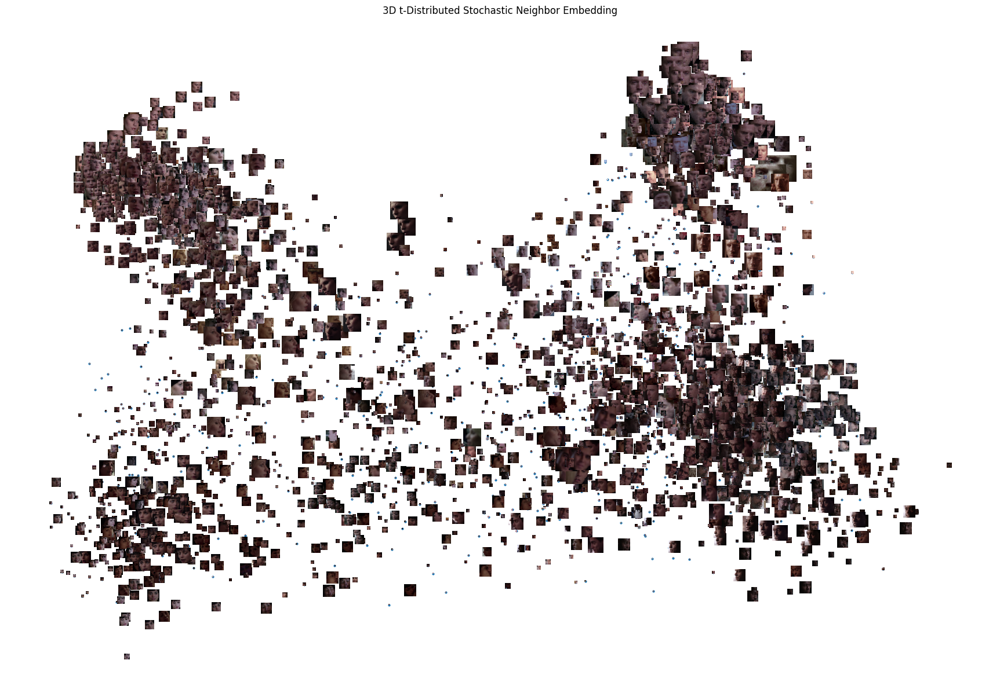

In [18]:
ax = scatter_thumbnails(pca_x, faces, scale_factor=32, show_images=True)
plt.title('3D t-Distributed Stochastic Neighbor Embedding')
plt.show()

# Clustering Methods

## TSNE

In [20]:
%%time

tsne = TSNE(perplexity=50,
            n_components=2,
            learning_rate=75,
            n_iter=1000,
            early_exaggeration=250,
            # method='exact',
            n_iter_without_progress=300
         )
tsne_x = tsne.fit_transform(pca_x)
print(f'Learning rate: {tsne.learning_rate}')
print(f'Number of iterations: {tsne.n_iter}')

Learning rate: 75
Number of iterations: 1000
CPU times: user 54.2 s, sys: 1.07 s, total: 55.2 s
Wall time: 9.74 s


  0%|          | 0/3438 [00:00<?, ?it/s]

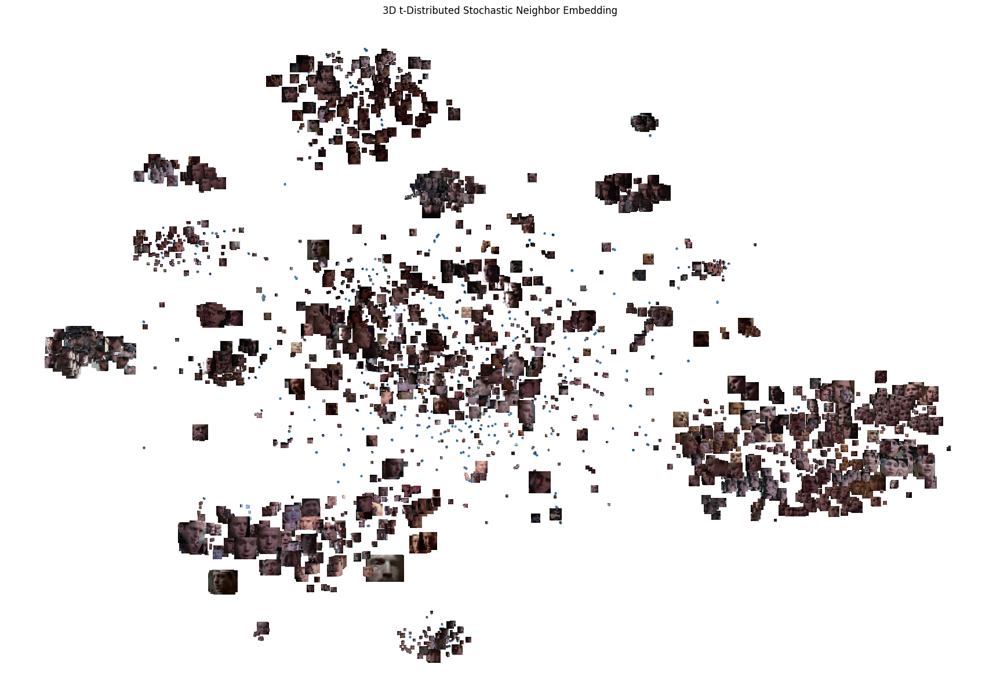

In [60]:
ax = scatter_thumbnails(tsne_x, faces, scale_factor=32, show_images=True)
plt.title('3D t-Distributed Stochastic Neighbor Embedding')
plt.show()

## DBSCAN

In [65]:
labels, colors = get_clusters(tsne_x, cluster.DBSCAN, n_jobs=-1, eps=4, min_samples=15)
# episode_fp['cluster'] = labels
print(list(set(labels)))

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, -1]


  0%|          | 0/3438 [00:00<?, ?it/s]

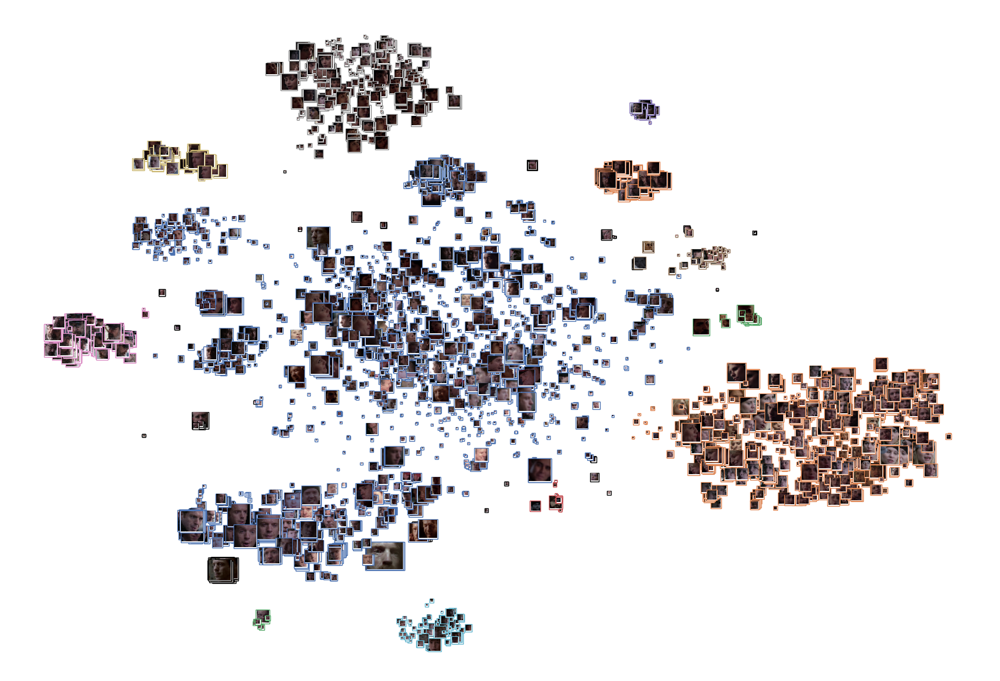

In [66]:
ax = scatter_thumbnails(tsne_x, faces, scale_factor=32, colors=colors, show_images=True)

In [71]:
episode_fp['label'] = labels
episode_fp.head()

,imdb_id,frame_num,face_num,x1,y1,x2,y2,img_height,img_width,area,pct_of_frame,season,episode,encoding,cast_x,cast_y,fp,label
0,1811020,192,0,798,196,916,314,1080,1920,13924,0.007,1,1,"[-0.1581144630908966, 0.11875572055578232, 0.0...","0000132,0507073,1072555,0362873,1459109,209313...","0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,0
1,1811020,216,0,1068,389,1491,812,1080,1920,178929,0.086,1,1,"[-0.035924218595027924, 0.09460100531578064, 0...","0000132,0507073,1072555,0362873,1459109,209313...","0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,-1
2,1811020,216,1,912,17,1205,311,1080,1920,86142,0.042,1,1,"[-0.10312943160533905, 0.1261938065290451, 0.0...","0000132,0507073,1072555,0362873,1459109,209313...","0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,0
3,1811020,240,0,1090,106,1384,400,1080,1920,86436,0.042,1,1,"[-0.18763160705566406, 0.08110883831977844, 0....","0000132,0507073,1072555,0362873,1459109,209313...","0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,0
4,1811020,240,1,674,522,968,816,1080,1920,86436,0.042,1,1,"[-0.11751651763916016, 0.1057925745844841, 0.0...","0000132,0507073,1072555,0362873,1459109,209313...","0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,-1


## HDBSCAN

In [67]:
labels, colors = get_clusters(tsne_x,
                              cluster.HDBSCAN,
                              n_jobs=-1,
                              store_centers='medoid',
                              min_cluster_size=15, 
                              min_samples=5,
                              cluster_selection_epsilon=5,
                              cluster_selection_method='leaf',
                              leaf_size=1)
print(list(set(labels)))

[0, 1, 2, 3, 4, 5, 6, 7, -1]


  0%|          | 0/3438 [00:00<?, ?it/s]

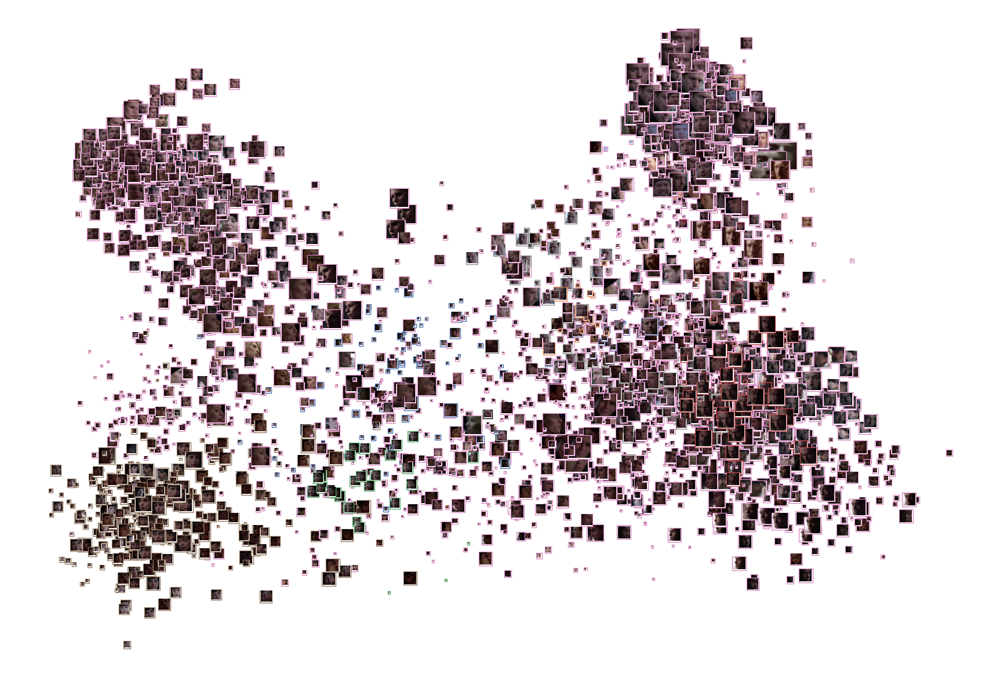

In [68]:
ax = scatter_thumbnails(x, faces, scale_factor=32, colors=colors, show_images=True)

## KMeans

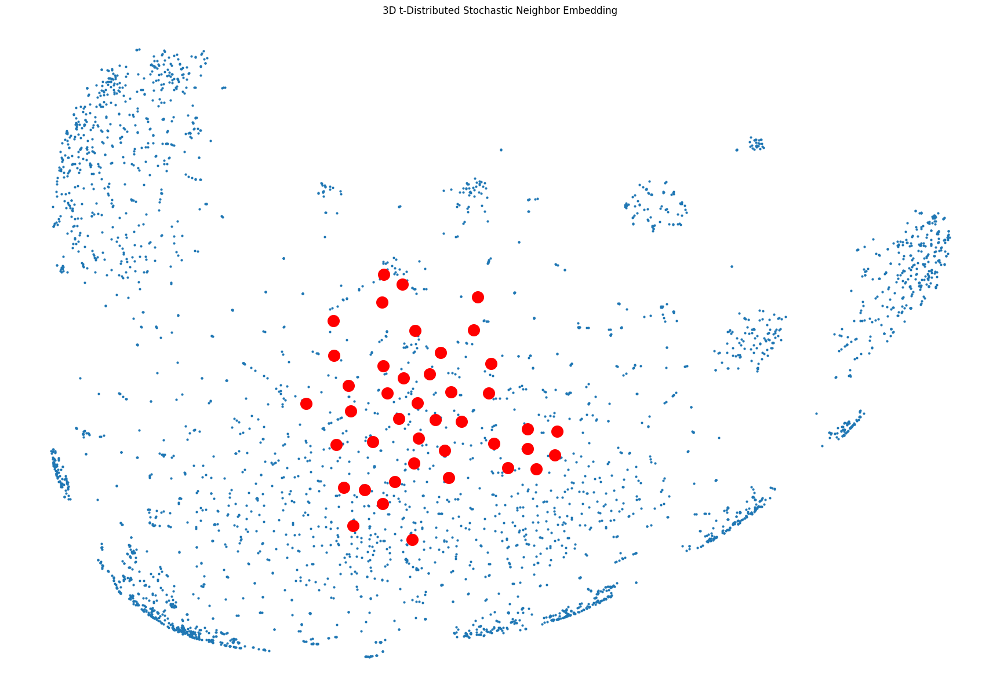

In [69]:
n_clusters = len(list(episode_fp.iloc[0]['cast'].split(',')))

kmeans = cluster.KMeans(n_clusters=n_clusters,
                        n_init=20,
                        max_iter=600)
x = kmeans.fit_transform(tsne_x)
ax = scatter_thumbnails(x, faces, scale_factor=16, show_images=False)
plt.title('3D t-Distributed Stochastic Neighbor Embedding')
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], c='red', s=200)
plt.show()

## Chinese Whispers

In [70]:
episode_fp = df_fp[(df_fp['season'] == 1) &
                   (df_fp['episode'] == 1)]
episode_fp = df_fp.copy()
data = np.array([np.array(ast.literal_eval(x)) for x in tqdm(episode_fp['encoding'].tolist())])
vectors = [dlib.vector(np.array(ast.literal_eval(x))) for x in tqdm(episode_fp['encoding'].tolist())]
faces = episode_fp['fp'].tolist()

  0%|          | 0/249536 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
labels = dlib.chinese_whispers_clustering(vectors, 0.5)
episode_fp['label'] = labels

In [118]:
count_df = episode_fp['label'].value_counts().reset_index().sort_values(by='count', ascending=False)
count_df = count_df[count_df['count'] > 10]
label_df = episode_fp.merge(count_df,
                            on='label',
                            how='inner')
label_df = label_df.sort_values(by='count')
label_df.head()

,imdb_id,frame_num,face_num,x1,y1,x2,y2,img_height,img_width,area,...,episode,encoding,filename,character,cast_id,cluster,cast,fp,label,count
1827,1811020,55872,0,897,262,1404,769,1080,1920,257049,...,1,"[-0.08577507734298706, 0.034806981682777405, 0...",S01E01_55872_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,764,11
1826,1811020,55848,0,845,262,1353,769,1080,1920,257556,...,1,"[-0.059907153248786926, 0.07203371822834015, 0...",S01E01_55848_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,764,11
1828,1811020,55896,0,897,262,1404,769,1080,1920,257049,...,1,"[-0.09911151230335236, 0.08754260838031769, 0....",S01E01_55896_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,764,11
1829,1811020,56016,0,743,313,1250,820,1080,1920,257049,...,1,"[-0.07226254791021347, 0.11333117634057999, 0....",S01E01_56016_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,764,11
1830,1811020,56112,0,794,262,1301,769,1080,1920,257049,...,1,"[-0.08803518861532211, 0.08138683438301086, 0....",S01E01_56112_0.png,NaN,NaN,NaN,"0000132,0507073,1072555,0362873,1459109,209313...",/home/amos/programs/FacesOfHomeland/data/image...,764,11


In [119]:
palette = get_palette(episode_fp)
colors = [tuple([y/255 for y in ImageColor.getcolor(palette[x], 'RGB')]) for x in episode_fp['label']]
ax = scatter_thumbnails(data, faces, scale_factor=32, colors=colors, show_images=True)

In [125]:
save_images(label_df,
            Path('./data/chinese_whispers'))

## Agglomerative Clustering

In [36]:
agg = cluster.AgglomerativeClustering(n_clusters=None,
                                      distance_threshold=0.9,
                                      metric='l2',
                                      linkage='complete')
clustering = agg.fit(pca_x)
episode_fp['label'] = clustering.labels_
print(len(list(set(clustering.labels_))))

15


  0%|          | 0/3438 [00:00<?, ?it/s]

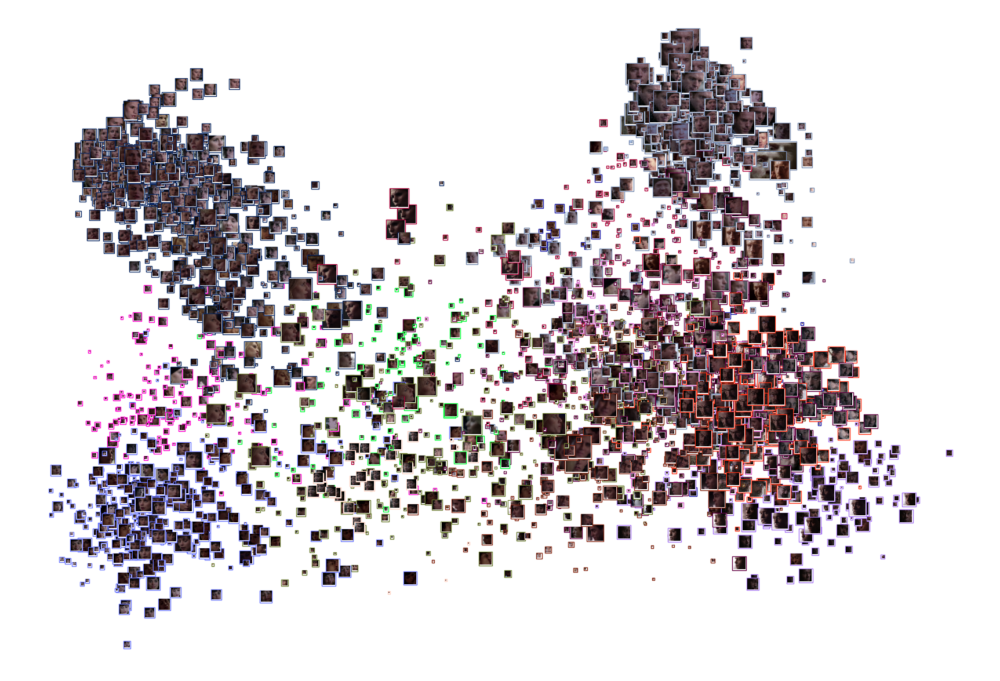

In [37]:
palette = get_palette(episode_fp)
colors = [tuple([y/255 for y in ImageColor.getcolor(palette[x], 'RGB')]) for x in episode_fp['label']]
ax = scatter_thumbnails(pca_x, faces, scale_factor=32, colors=colors, show_images=True)

In [67]:
save_images(episode_fp, Path('./data/agglomerative_clustering'))

### Birch to Agglomerative Clustering (No difference)

In [100]:
brc = cluster.Birch(threshold=0.5,
                    n_clusters=None,
                    branching_factor=5000)
brc_x = brc.fit_transform(data)

In [109]:
agg = cluster.AgglomerativeClustering(n_clusters=None,
                                      distance_threshold=4,
                                      # metric='cosine',
                                      # linkage='complete'
                                     )
clustering = agg.fit(brc_x)
episode_fp['label'] = clustering.labels_
print(len(list(set(clustering.labels_))))

8


  0%|          | 0/3438 [00:00<?, ?it/s]

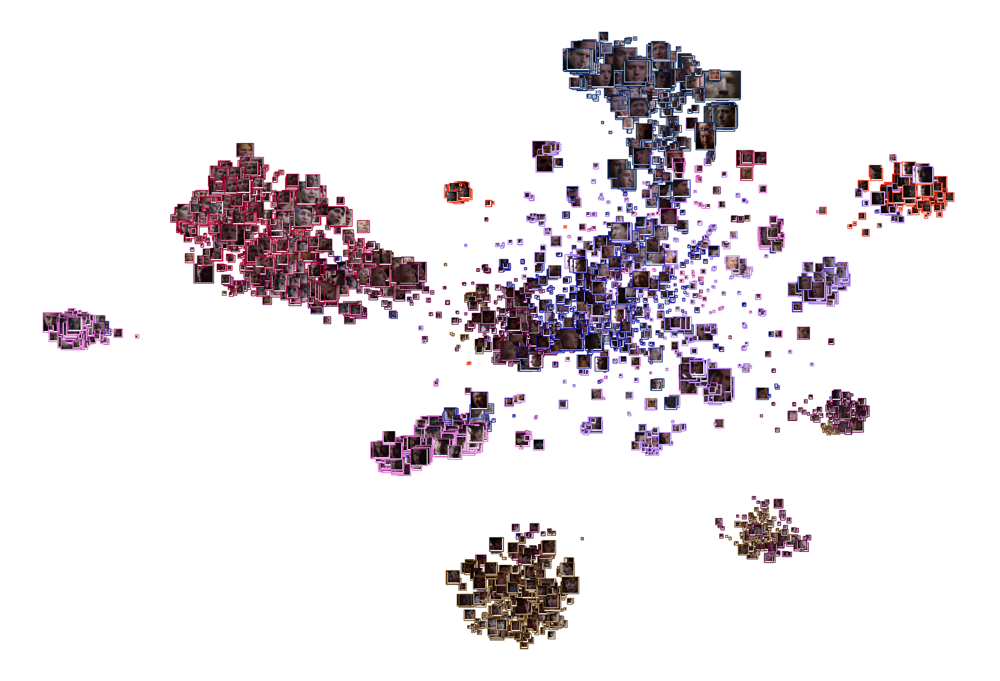

In [110]:
palette = get_palette(episode_fp)
colors = [tuple([y/255 for y in ImageColor.getcolor(palette[x], 'RGB')]) for x in episode_fp['label']]
ax = scatter_thumbnails(tsne_x, faces, scale_factor=32, colors=colors, show_images=True)

## Birch Clustering

In [38]:
brc = cluster.Birch(threshold=0.5,
                    n_clusters=None,
                    branching_factor=5000)
brc_x = brc.fit_transform(pca_x)
episode_fp['label'] = brc.labels_
episode_fp['label'].nunique()

11

  0%|          | 0/3438 [00:00<?, ?it/s]

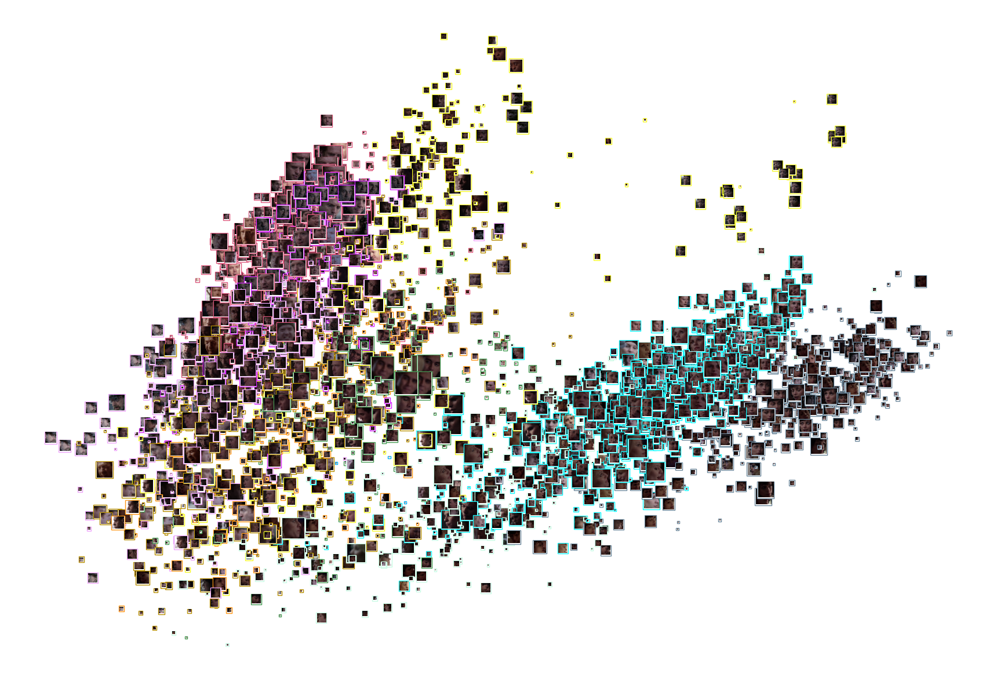

In [39]:
palette = get_palette(episode_fp)
colors = [tuple([y/255 for y in ImageColor.getcolor(palette[x], 'RGB')]) for x in episode_fp['label']]
ax = scatter_thumbnails(brc_x, faces, scale_factor=32, colors=colors, show_images=True)

In [122]:
dbscan = cluster.DBSCAN()
db_x = dbscan.fit_predict(data)
episode_fp['label'] = dbscan.labels_

  0%|          | 0/3438 [00:00<?, ?it/s]

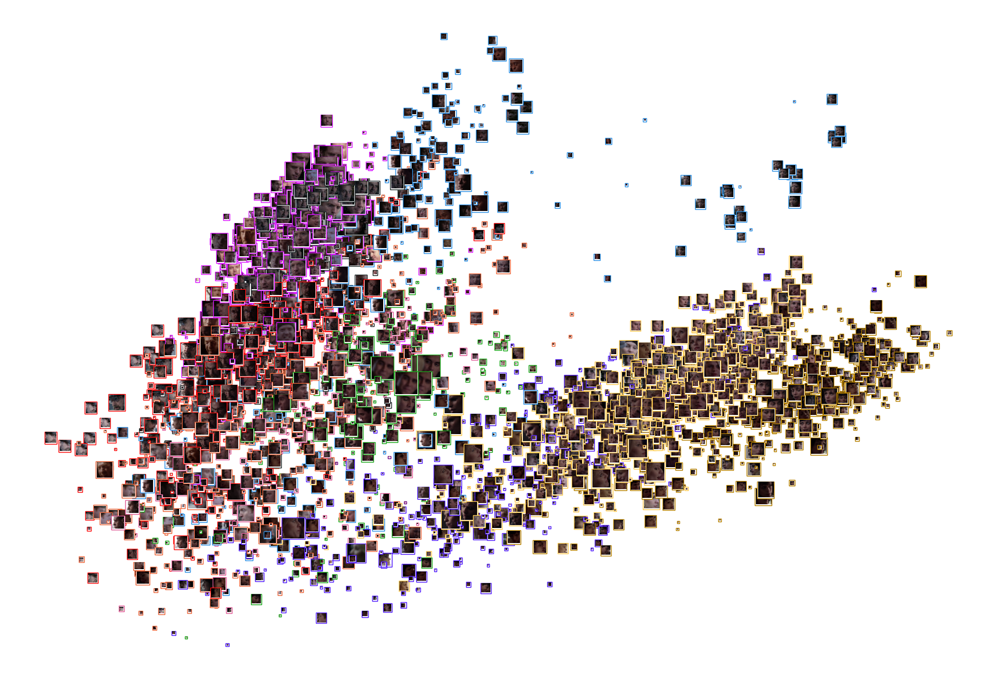

In [125]:
palette = get_palette(episode_fp)
colors = [tuple([y/255 for y in ImageColor.getcolor(palette[x], 'RGB')]) for x in episode_fp['label']]
ax = scatter_thumbnails(brc_x, faces, scale_factor=32, colors=colors, show_images=True)

## Affinity Propagation

In [130]:
# PCA first to speed it up
x = PCA(n_components='mle', svd_solver='full').fit_transform(data)
ap = cluster.AffinityPropagation().fit(x)
episode_fp['label'] = ap.labels_

  0%|          | 0/3438 [00:00<?, ?it/s]

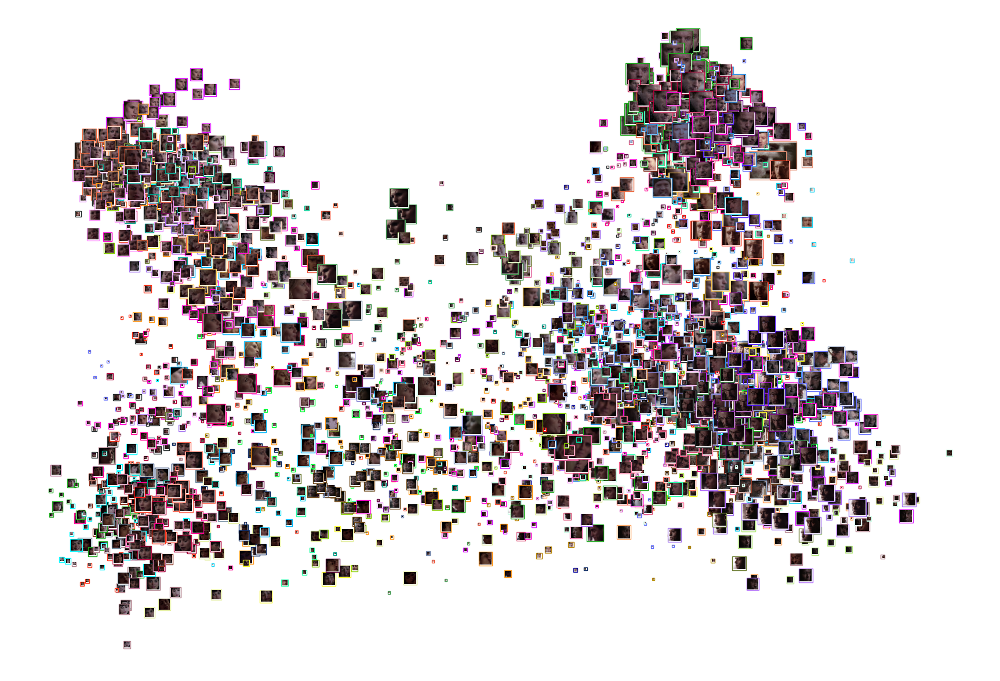

In [131]:
palette = get_palette(episode_fp)
colors = [tuple([y/255 for y in ImageColor.getcolor(palette[x], 'RGB')]) for x in episode_fp['label']]
ax = scatter_thumbnails(x, faces, scale_factor=32, colors=colors, show_images=True)

## Optics

In [33]:
o = cluster.OPTICS(xi=0.01,
                   min_cluster_size=20).fit(pca_x)
episode_fp['label'] = o.labels_
episode_fp['label'].nunique()

21

  0%|          | 0/3438 [00:00<?, ?it/s]

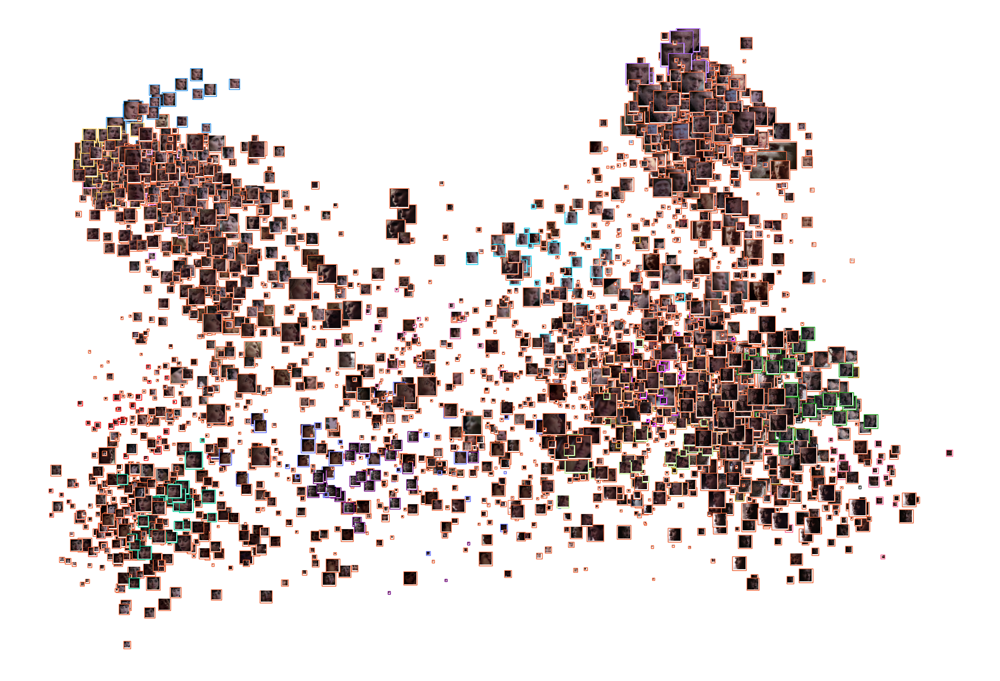

In [34]:
palette = get_palette(episode_fp)
colors = [tuple([y/255 for y in ImageColor.getcolor(palette[x], 'RGB')]) for x in episode_fp['label']]
ax = scatter_thumbnails(pca_x, faces, scale_factor=32, colors=colors, show_images=True)

## Spectral Clustering

In [39]:
spec = cluster.SpectralClustering(n_clusters=None, n_components=3).fit(pca_x)
episode_fp['label'] = spec.labels_
episode_fp['label'].nunique()

InvalidParameterError: The 'n_clusters' parameter of SpectralClustering must be an int in the range [1, inf). Got None instead.

  0%|          | 0/3438 [00:00<?, ?it/s]

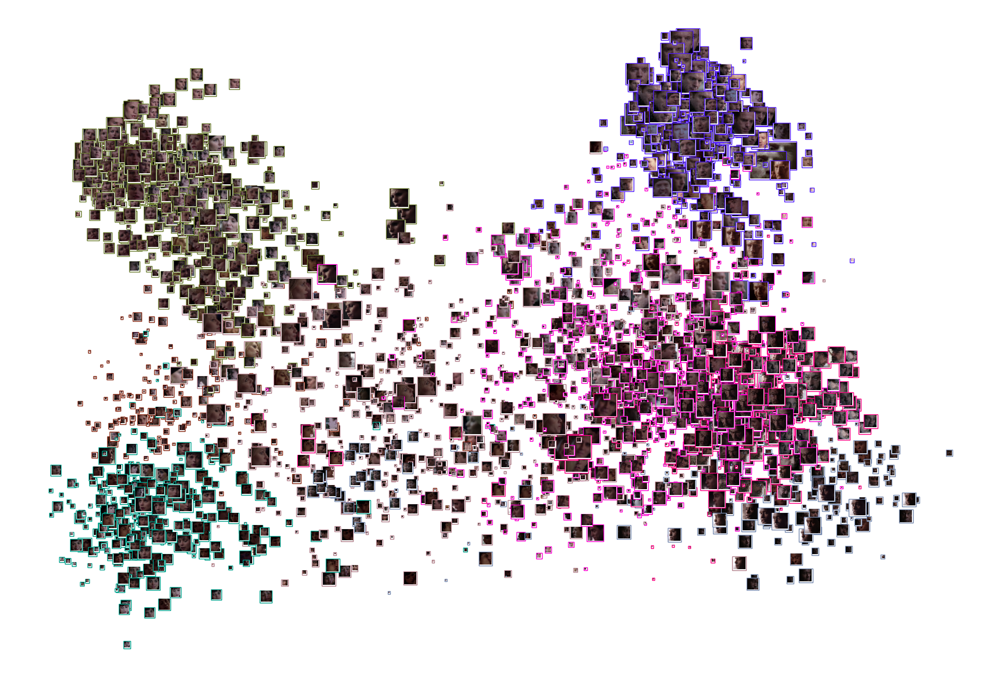

In [36]:
palette = get_palette(episode_fp)
colors = [tuple([y/255 for y in ImageColor.getcolor(palette[x], 'RGB')]) for x in episode_fp['label']]
ax = scatter_thumbnails(pca_x, faces, scale_factor=32, colors=colors, show_images=True)